In [1]:
#Import libraries

from scipy import stats
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None

In [2]:
#Read in the data
df = pd.read_csv('/Users/twinklejain/Desktop/Data Analysis Project/Movie Industry/movies.csv')

In [3]:
#Get a glimpse of the data
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7591 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    5497 non-null   float64
 12  gross     7479 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


In [5]:
#Checking for the missing data
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))


name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


Skewness of 'budget' column: 2.452843920217447


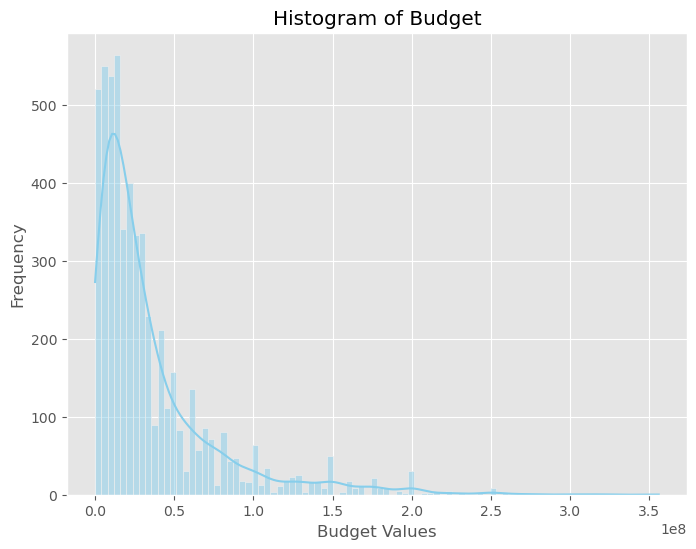

In [6]:
from scipy.stats import skew

# Calculate skewness of 'budget' column
skewness = skew(df['budget'].dropna())

# Print skewness value
print("Skewness of 'budget' column:", skewness)

# Plot histogram with KDE (kernel density estimate)
plt.figure(figsize=(8, 6))
sns.histplot(df['budget'].dropna(), kde=True, color='skyblue')
plt.title('Histogram of Budget')
plt.xlabel('Budget Values')
plt.ylabel('Frequency')
plt.show()

In [7]:
#Imputing the missing values in budget column with median as the the distribution of the 'budget' column is significantly right-skewed (positively skewed).
# Calculate the median of the 'budget' column
median_budget = df['budget'].median()

# Impute missing values in the 'budget' column with the median
df['budget'].fillna(median_budget, inplace=True)

In [8]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7591 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    7668 non-null   float64
 12  gross     7479 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


In [9]:
# Impute missing values in the 'rating' column with the mode since it is a categorical column
mode_rating = df['rating'].mode()[0]
df['rating'].fillna(mode_rating, inplace=True)
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7668 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    7668 non-null   float64
 12  gross     7479 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


Skewness of 'gross' column: 5.313323945965261


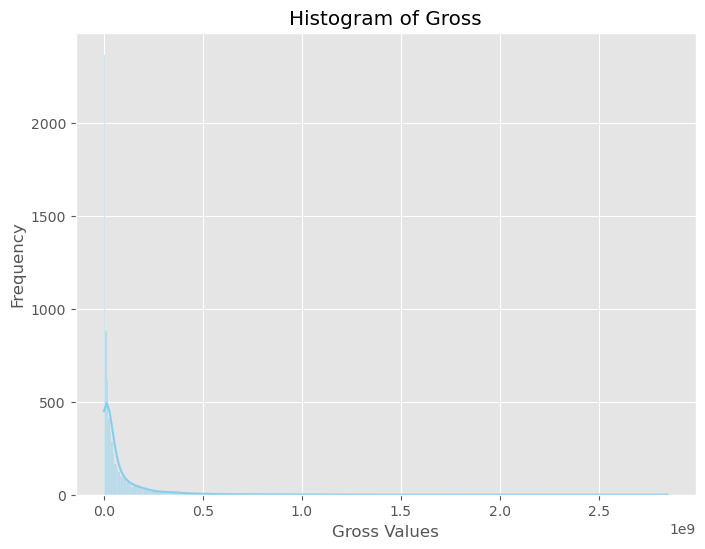

In [10]:

# Calculate skewness of 'gross' column
skewness_gross = skew(df['gross'].dropna())

# Print skewness value
print("Skewness of 'gross' column:", skewness_gross)

# Plot histogram with KDE (kernel density estimate)
plt.figure(figsize=(8, 6))
sns.histplot(df['gross'].dropna(), kde=True, color='skyblue')
plt.title('Histogram of Gross')
plt.xlabel('Gross Values')
plt.ylabel('Frequency')
plt.show()

In [11]:
# Calculate the median of the 'gross' column
median_gross = df['gross'].median()

# Impute missing values in the 'gross' column with the median since the distribution is heavily right skewed
df['gross'].fillna(median_gross, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7668 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    7668 non-null   float64
 12  gross     7668 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


In [12]:
# Drop rows with missing values in company column
df.dropna(subset=['company'], inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7651 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7651 non-null   object 
 1   rating    7651 non-null   object 
 2   genre     7651 non-null   object 
 3   year      7651 non-null   int64  
 4   released  7651 non-null   object 
 5   score     7650 non-null   float64
 6   votes     7650 non-null   float64
 7   director  7651 non-null   object 
 8   writer    7648 non-null   object 
 9   star      7650 non-null   object 
 10  country   7650 non-null   object 
 11  budget    7651 non-null   float64
 12  gross     7651 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7649 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 956.4+ KB


In [13]:
#Checking for missing data
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 0%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 0%
gross - 0%
company - 0%
runtime - 0%


In [14]:
# Data Types for our columns

print(df.dtypes)

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object


In [15]:
#Change data type of budget and gross column
df['budget']= df['budget'].astype('int64')
df['gross']= df['gross'].astype('int64')
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [16]:
pd.set_option('display.max_rows', None)
df=df.sort_values(by=['gross'], inplace=False, ascending=False)

In [17]:
#Drop any duplicates
df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0


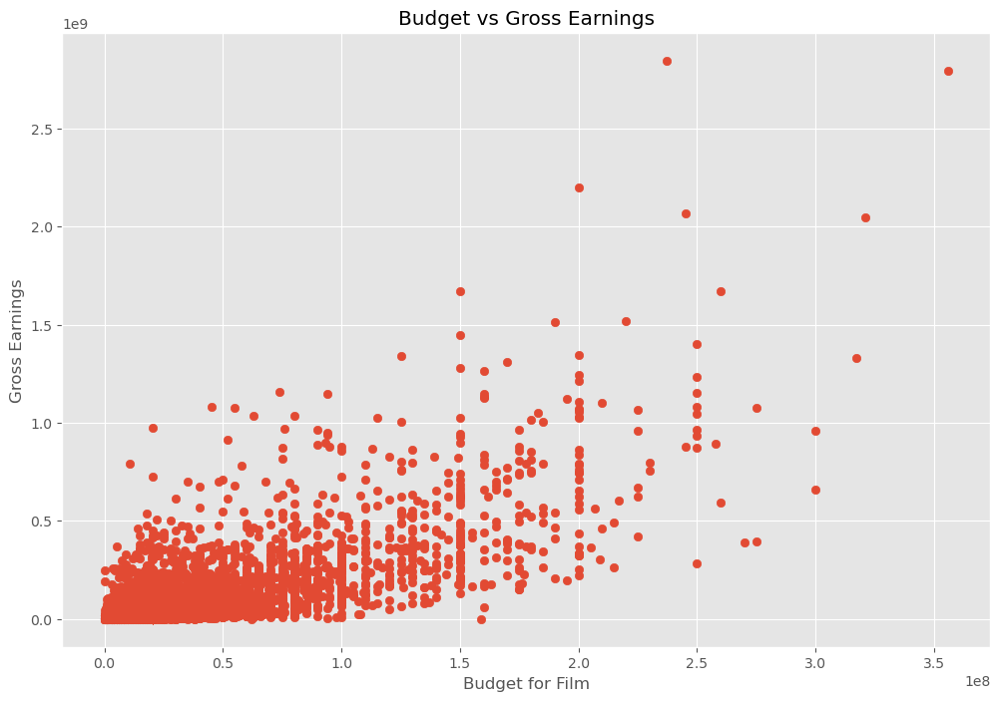

In [18]:
#Finding correlation between budget and gross using scatter plot

plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Budget for Film')
plt.ylabel('Gross Earnings')
plt.show()

In [19]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0


<Axes: xlabel='budget', ylabel='gross'>

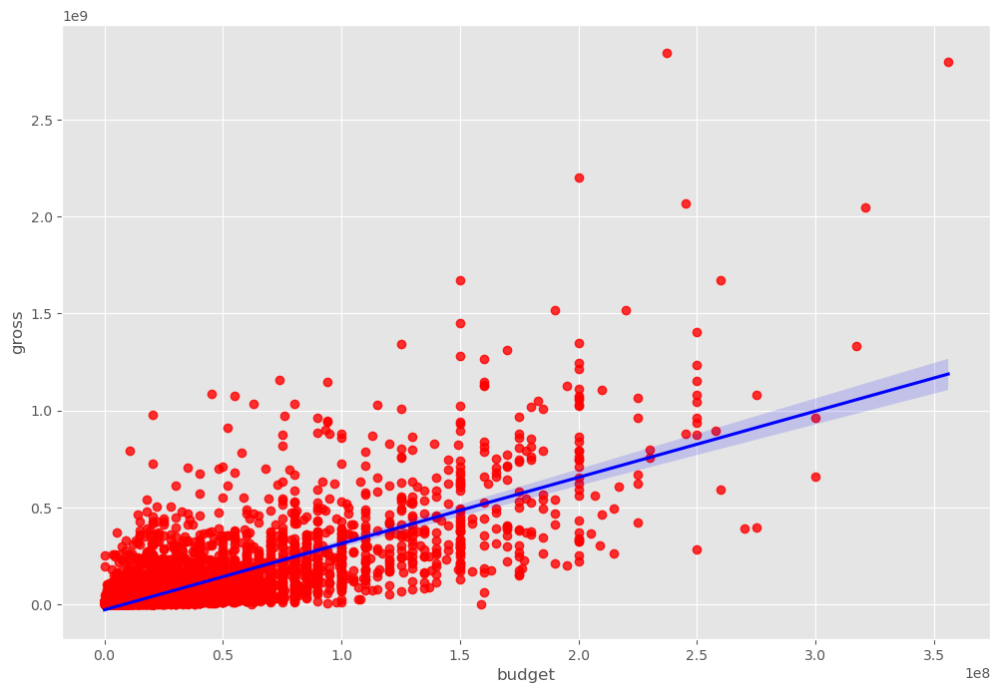

In [20]:
# Determine if they are correlated using regression plot. Plot budget vs gross using seaborn
sns.regplot(x='budget', y='gross', data=df, scatter_kws ={"color": "red"}, line_kws={"color":"blue"})

In [21]:
#There is a positive correlation. Let's look at the actual correlation
# df.corr() #Takes into consideration only numerical columns. By deafult, takes pearson method. Other methods are kendall and spearman
df.corr(method = 'pearson')

/var/folders/cq/r95733l13gs1w5n9m6yt6_mh0000gn/T/ipykernel_15346/4142621625.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr(method = 'pearson')


,year,score,votes,budget,gross,runtime
year,1.000000,0.097435,0.222851,0.292458,0.259898,0.120145
score,0.097435,1.000000,0.409157,0.061207,0.185236,0.398956
votes,0.222851,0.409157,1.000000,0.460741,0.631987,0.308996
budget,0.292458,0.061207,0.460741,1.000000,0.745845,0.273217
gross,0.259898,0.185236,0.631987,0.745845,1.000000,0.244154
runtime,0.120145,0.398956,0.308996,0.273217,0.244154,1.000000


/var/folders/cq/r95733l13gs1w5n9m6yt6_mh0000gn/T/ipykernel_15346/2955742399.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr(method='pearson')


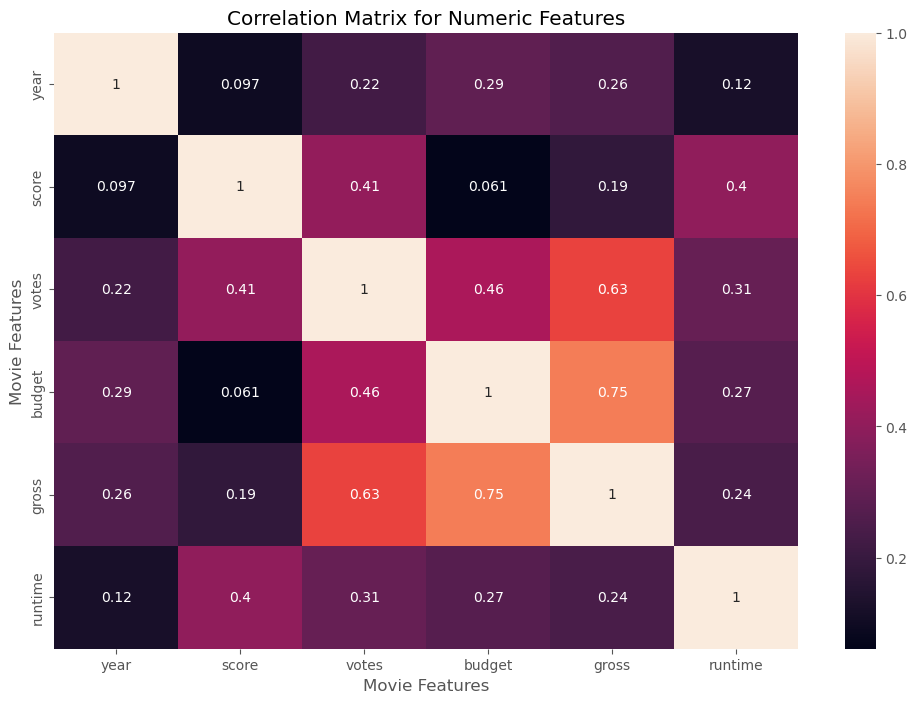

In [22]:
#It has been established that there is high correlation between budget and gross
# Make the correlation matrix visually appealing
correlation_matrix = df.corr(method='pearson')
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [23]:
# Create a copy of the original DataFrame
df_numerized = df.copy()

# Numerically encode categorical columns
for col in df_numerized.columns:
    if df_numerized[col].dtype == 'object' or pd.api.types.is_string_dtype(df_numerized[col]):
        df_numerized[col] = df_numerized[col].astype('category')  # Convert the column to 'category' data type
        df_numerized[col] = df_numerized[col].cat.codes  # Numerically encode the categories within the column

# Output the numerically encoded DataFrame
print(df_numerized)


      name  rating  genre  year  released  score      votes  director  writer  \
5445   532       5      0  2009       696    7.8  1100000.0      1153    1775   
7445   534       5      0  2019       183    8.4   903000.0       162     740   
3045  6881       5      6  1997       704    7.8  1100000.0      1153    1775   
6663  5133       5      0  2015       698    7.8   876000.0      1123    2542   
7244   535       5      0  2018       192    8.4   897000.0       162     740   
7480  6181       4      2  2019      1488    6.9   222000.0      1451    1915   
6653  2965       5      0  2015      1704    7.0   593000.0       517    3557   
6043  5489       5      0  2012      2471    8.0  1300000.0      1512    2307   
6646  2143       5      0  2015       221    7.1   370000.0      1186     703   
7494  2129       4      2  2019      2674    6.8   148000.0       432    1946   
6644   533       5      0  2015      2234    7.3   777000.0      1512    2307   
7247   790       5      0  2

In [24]:
#Print the original dataframe
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0


In [25]:
correlation_mat = df_numerized.corr()
corr_pairs = correlation_mat.unstack()
corr_pairs
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

genre     budget     -0.328660
budget    genre      -0.328660
genre     gross      -0.233496
gross     genre      -0.233496
rating    budget     -0.148410
budget    rating     -0.148410
votes     genre      -0.145319
genre     votes      -0.145319
score     country    -0.133489
country   score      -0.133489
gross     rating     -0.130236
rating    gross      -0.130236
year      genre      -0.082217
genre     year       -0.082217
company   rating     -0.081343
rating    company    -0.081343
runtime   country    -0.078097
country   runtime    -0.078097
company   genre      -0.070665
genre     company    -0.070665
year      country    -0.068748
country   year       -0.068748
runtime   genre      -0.053170
genre     runtime    -0.053170
          country    -0.036505
country   genre      -0.036505
budget    writer     -0.031030
writer    budget     -0.031030
star      year       -0.028164
year      star       -0.028164
writer    gross      -0.023294
gross     writer     -0.023294
released

In [26]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr
#votes and budget have the highest correlation to gross earnings

gross     votes       0.631987
votes     gross       0.631987
gross     budget      0.745845
budget    gross       0.745845
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7651 entries, 5445 to 3203
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7651 non-null   object 
 1   rating    7651 non-null   object 
 2   genre     7651 non-null   object 
 3   year      7651 non-null   int64  
 4   released  7651 non-null   object 
 5   score     7650 non-null   float64
 6   votes     7650 non-null   float64
 7   director  7651 non-null   object 
 8   writer    7648 non-null   object 
 9   star      7650 non-null   object 
 10  country   7650 non-null   object 
 11  budget    7651 non-null   int64  
 12  gross     7651 non-null   int64  
 13  company   7651 non-null   object 
 14  runtime   7649 non-null   float64
dtypes: float64(3), int64(3), object(9)
memory usage: 956.4+ KB


In [28]:
# Example: ANOVA comparing mean gross revenue across multiple genres
#Null Hypothesis (H0): There is no significant difference in the mean gross revenue across the genres.
#Alternative Hypothesis (H1): There is a significant difference in the mean gross revenue across the genres.
genre_groups = [df[df['genre'] == genre]['gross'] for genre in df['genre'].unique()]
f_statistic, p_value = stats.f_oneway(*genre_groups)
print("F-Statistic for ANOVA across genres:", f_statistic)
print("P-Value for ANOVA across genres:", p_value)

F-Statistic for ANOVA across genres: 53.75389777474596
P-Value for ANOVA across genres: 4.498250309442618e-182


In [29]:
# Since p-value is less than 0.05, we reject the null hypothesis and conclude that there is significant difference in the mean gross revenue across multiple genres